## Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pywt

## Importing Dataset

In [2]:
act = 'stand'
file = pd.read_csv(f'../Data/Dataset/{act}.csv')
file.head()

,timestamp,amplitude_sub0,amplitude_sub1,amplitude_sub2,amplitude_sub3,amplitude_sub4,amplitude_sub5,amplitude_sub6,amplitude_sub7,amplitude_sub8,...,phase_sub247,phase_sub248,phase_sub249,phase_sub250,phase_sub251,phase_sub252,phase_sub253,phase_sub254,phase_sub255,label
0,2025-02-13 15:34:56:570091,0.0,0.0,0.0,0.0,0.0,0.0,0.003384,0.001436,0.002270,...,23.382092,22.008691,24.631138,25.935682,0.0,0.0,0.0,0.0,0.0,stand
1,2025-02-13 15:34:56:671458,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.001180,0.002951,...,80.754115,84.483710,86.771048,84.020063,0.0,0.0,0.0,0.0,0.0,stand
2,2025-02-13 15:34:56:774875,0.0,0.0,0.0,0.0,0.0,0.0,0.002088,0.002088,0.000819,...,-14.715069,-14.656313,-15.119961,-15.905359,0.0,0.0,0.0,0.0,0.0,stand
3,2025-02-13 15:34:56:990032,0.0,0.0,0.0,0.0,0.0,0.0,0.000693,0.001250,0.001250,...,-10.318004,-11.035028,-10.995574,-13.012476,0.0,0.0,0.0,0.0,0.0,stand
4,2025-02-13 15:34:57:082019,0.0,0.0,0.0,0.0,0.0,0.0,0.003041,0.000399,0.002824,...,57.120963,57.166024,56.465527,59.697780,0.0,0.0,0.0,0.0,0.0,stand


In [3]:
df = file.iloc[:,1:257]
df

,amplitude_sub0,amplitude_sub1,amplitude_sub2,amplitude_sub3,amplitude_sub4,amplitude_sub5,amplitude_sub6,amplitude_sub7,amplitude_sub8,amplitude_sub9,...,amplitude_sub246,amplitude_sub247,amplitude_sub248,amplitude_sub249,amplitude_sub250,amplitude_sub251,amplitude_sub252,amplitude_sub253,amplitude_sub254,amplitude_sub255
0,0.0,0.0,0.0,0.0,0.0,0.0,0.003384,0.001436,0.002270,0.000479,...,0.001395,0.002369,0.001220,0.001070,0.001220,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.001180,0.002951,0.002247,...,0.000835,0.004173,0.001252,0.003009,0.000933,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.002088,0.002088,0.000819,0.000409,...,0.000916,0.004410,0.002590,0.002088,0.000916,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.000693,0.001250,0.001250,0.002022,...,0.002326,0.003485,0.003271,0.001734,0.000775,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.003041,0.000399,0.002824,0.001694,...,0.000565,0.005896,0.004465,0.001263,0.003119,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3168,0.0,0.0,0.0,0.0,0.0,0.0,0.001450,0.000569,0.000900,0.000000,...,0.000000,0.001991,0.000900,0.000636,0.000569,0.0,0.0,0.0,0.0,0.0
3169,0.0,0.0,0.0,0.0,0.0,0.0,0.000759,0.001400,0.001875,0.000720,...,0.000866,0.000759,0.001519,0.001441,0.000960,0.0,0.0,0.0,0.0,0.0
3170,0.0,0.0,0.0,0.0,0.0,0.0,0.001420,0.000402,0.001171,0.001420,...,0.000284,0.001024,0.002427,0.001024,0.001607,0.0,0.0,0.0,0.0,0.0
3171,0.0,0.0,0.0,0.0,0.0,0.0,0.000909,0.000563,0.000000,0.000252,...,0.002949,0.003362,0.002078,0.000909,0.001690,0.0,0.0,0.0,0.0,0.0


## Subcarrier Removal

In [4]:
def remove_subcarrier(amplitude):
    columns_to_remove = ['amplitude_sub0', 'amplitude_sub1', 'amplitude_sub2', 'amplitude_sub3', 'amplitude_sub4', 'amplitude_sub5', 'amplitude_sub127', 'amplitude_sub128', 'amplitude_sub129', 'amplitude_sub251', 'amplitude_sub252', 'amplitude_sub253', 'amplitude_sub254', 'amplitude_sub255']
    
    return amplitude.drop(columns=columns_to_remove)

In [5]:
rem = remove_subcarrier(df)
rem.head()

,amplitude_sub6,amplitude_sub7,amplitude_sub8,amplitude_sub9,amplitude_sub10,amplitude_sub11,amplitude_sub12,amplitude_sub13,amplitude_sub14,amplitude_sub15,...,amplitude_sub241,amplitude_sub242,amplitude_sub243,amplitude_sub244,amplitude_sub245,amplitude_sub246,amplitude_sub247,amplitude_sub248,amplitude_sub249,amplitude_sub250
0,0.003384,0.001436,0.002270,0.000479,0.001692,0.001220,0.001513,0.003946,0.001220,0.000957,...,0.001973,0.002911,0.003961,0.001914,0.001354,0.001395,0.002369,0.001220,0.001070,0.001220
1,0.000000,0.001180,0.002951,0.002247,0.003847,0.001180,0.002086,0.003338,0.003038,0.001320,...,0.001180,0.006203,0.007672,0.002247,0.006532,0.000835,0.004173,0.001252,0.003009,0.000933
2,0.002088,0.002088,0.000819,0.000409,0.002981,0.002047,0.000409,0.001638,0.001295,0.000579,...,0.002205,0.005131,0.002047,0.001295,0.001228,0.000916,0.004410,0.002590,0.002088,0.000916
3,0.000693,0.001250,0.001250,0.002022,0.000000,0.000775,0.001734,0.001250,0.002022,0.000981,...,0.002452,0.004965,0.004928,0.002963,0.001961,0.002326,0.003485,0.003271,0.001734,0.000775
4,0.003041,0.000399,0.002824,0.001694,0.004858,0.001786,0.001263,0.001997,0.002259,0.001440,...,0.001263,0.003767,0.004674,0.001597,0.001440,0.000565,0.005896,0.004465,0.001263,0.003119


## DF to Numpy

In [6]:
def readamp(removed):

    # converts element of dataframe to numeric value and due to 'coerece' non-numeric values is converted to NaN
    df = removed.apply(pd.to_numeric, errors='coerce')
    
    df = np.nan_to_num(df) # NaN is replaced with 0

    dfs = df[:, :]

    return dfs

In [7]:
amplitude = readamp(rem)
amplitude

array([[0.00338376, 0.00143561, 0.00226989, ..., 0.00122003, 0.00107004,
        0.00122003],
       [0.        , 0.00118028, 0.00295069, ..., 0.00125187, 0.00300912,
        0.00093309],
       [0.00208793, 0.00208793, 0.00081895, ..., 0.00258975, 0.00208793,
        0.00091562],
       ...,
       [0.00142011, 0.00040167, 0.00117105, ..., 0.00242668, 0.00102405,
        0.00160667],
       [0.0009085 , 0.00056343, 0.        , ..., 0.00207782, 0.0009085 ,
        0.00169029],
       [0.00289864, 0.00216052, 0.00136643, ..., 0.00204965, 0.00030554,
        0.0016454 ]])

### Hample Filter

In [8]:
def hampel(removed, k=11, t0=3, outliers_return=False):
    

    values = pd.Series(removed.copy())

    # Hampel Filter
    L = 1.4826

    rolling_median = values.rolling(k).median()
    difference = np.abs(rolling_median - values)
    median_abs_deivation = difference.rolling(k).median()

    threshold = t0 * L * median_abs_deivation
    outlier_idx = difference > threshold
    values[outlier_idx] = rolling_median

    if outliers_return:
        return values, outlier_idx

    return values

### NumPy Array Initialization

In [9]:
def filter_hampel(numeric):
    data = numeric.shape[0] # Finds No. of rows in the Numpy array
    res = np.zeros_like(numeric) # creates new array with same shape as data

    for i in range(numeric.shape[1]):
        res[:data, i] = hampel(numeric[:, i])[:data] # replaces filtered data in same column
    
    return res

In [10]:
result = filter_hampel(amplitude)
result

array([[0.00338376, 0.00143561, 0.00226989, ..., 0.00122003, 0.00107004,
        0.00122003],
       [0.        , 0.00118028, 0.00295069, ..., 0.00125187, 0.00300912,
        0.00093309],
       [0.00208793, 0.00208793, 0.00081895, ..., 0.00258975, 0.00208793,
        0.00091562],
       ...,
       [0.00142011, 0.00040167, 0.00117105, ..., 0.00242668, 0.00102405,
        0.00160667],
       [0.0009085 , 0.00056343, 0.        , ..., 0.00207782, 0.0009085 ,
        0.00169029],
       [0.00289864, 0.00216052, 0.00136643, ..., 0.00204965, 0.00030554,
        0.0016454 ]])

## Discrete Wavelet Transform (DWT) (Denoising)

In [11]:
def dwt(hampeled, t1=0.25):
    threshold = t1

    hamp = hampeled.copy()

    window = pywt.Wavelet('sym5')
    max_level = pywt.dwt_max_level(hamp.shape[0], window.dec_len)

    coeffs = pywt.wavedec(hamp, 'sym5', level=max_level)

    for i in range(1, len(coeffs)):
        coeffs[i] = pywt.threshold(coeffs[i], threshold * max(coeffs[i]), mode='soft')

    denoise = pywt.waverec(coeffs, 'sym5')

    return denoise

### NumPy Array Initialization

In [12]:
def filter_dwt(numeric):
    data = numeric.shape[0] # Finds No. of rows in the Numpy array
    res = np.zeros_like(numeric) # creates new array with same shape as data

    for i in range(numeric.shape[1]):
        res[:data, i] = dwt(numeric[:, i])[:data] # replaces filtered data in same column
    
    return res

In [13]:
denoised = filter_dwt(amplitude)
denoised

array([[0.00193036, 0.00152093, 0.00092923, ..., 0.00275795, 0.00220563,
        0.0013809 ],
       [0.00208793, 0.00165946, 0.00123479, ..., 0.00272359, 0.00219194,
        0.00139523],
       [0.00233301, 0.00186763, 0.00157305, ..., 0.00268427, 0.00217642,
        0.00141024],
       ...,
       [0.00285975, 0.00236302, 0.00192805, ..., 0.00227074, 0.00149208,
        0.00185935],
       [0.00286082, 0.00236396, 0.00192008, ..., 0.00227752, 0.00148028,
        0.00185272],
       [0.00286056, 0.00236346, 0.00191141, ..., 0.00228456, 0.00147065,
        0.00184856]])

## Hampel & DWT Filter

In [14]:
def filter(numeric):
    data = numeric.shape[0] # Finds No. of rows in the Numpy array
    res = np.zeros_like(numeric) # creates new array with same shape as data

    for i in range(numeric.shape[1]):
        res[:data, i] = dwt(hampel(numeric[:, i]))[:data] # replaces filtered data in same column
    
    return res

In [15]:
filtered = filter(amplitude)
filtered

array([[0.00296687, 0.00230062, 0.00305535, ..., 0.00181108, 0.00179274,
        0.00095477],
       [0.00260534, 0.00194562, 0.00264739, ..., 0.00184883, 0.00260869,
        0.0008581 ],
       [0.00211474, 0.00155903, 0.00215255, ..., 0.00198227, 0.00209614,
        0.0006886 ],
       ...,
       [0.00150402, 0.0012816 , 0.00127067, ..., 0.00180369, 0.00100946,
        0.00137317],
       [0.00150228, 0.00127844, 0.00126813, ..., 0.00186326, 0.00099955,
        0.00143191],
       [0.00150053, 0.00127526, 0.00126558, ..., 0.00190786, 0.00103452,
        0.00150039]])

## Hampel Output Visualization

In [16]:
def hampel_all(num):
    data = num.shape[0]
    
    res = np.zeros_like(num)
    outliers = []

    for i in range(num.shape[1]):
        res[:data, i], out = hampel(num[:, i], outliers_return=True)[:data]
        outliers.append(out)
        
    return res, outliers

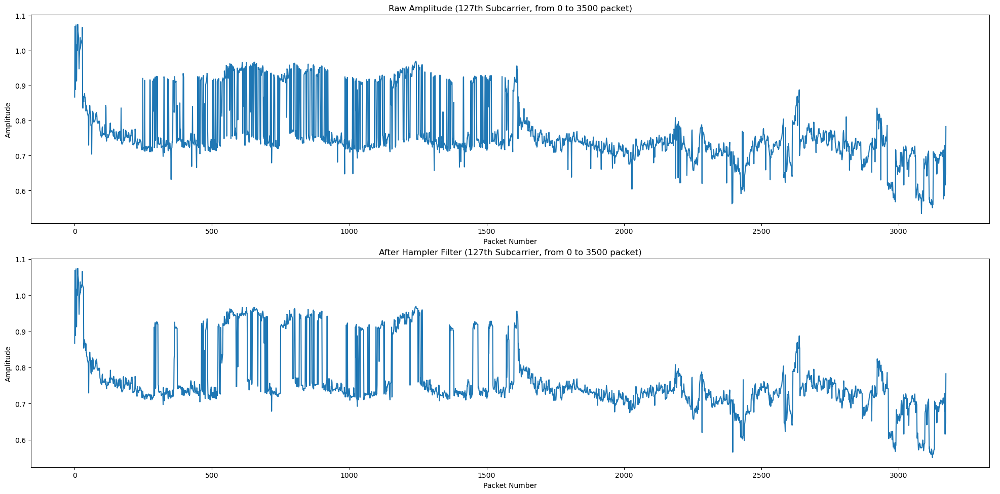

In [17]:
fig = plt.figure(figsize = (20, 10))
ax = fig.add_subplot(111)

no_hampel = amplitude
with_hampel, outliers = hampel_all(no_hampel)

ax3 = fig.add_subplot(211)
plt.plot((no_hampel)[:, 120])
ax3.set_title("Raw Amplitude (127th Subcarrier, from 0 to 3500 packet)")

ax4 = fig.add_subplot(212)
plt.plot(with_hampel[:, 120])
ax4.set_title("After Hampler Filter (127th Subcarrier, from 0 to 3500 packet)")

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)

ax3.set_ylabel('Amplitude')
ax4.set_ylabel('Amplitude')
ax3.set_xlabel('Packet Number')
ax4.set_xlabel('Packet Number')

fig.tight_layout(pad=0.5)
plt.show()

## DWT Output Visualization

In [18]:
def dwt_all(num):
    data = num.shape[0]

    res = np.zeros_like(num)

    for i in range(num.shape[1]):
        res[:data, i] = dwt(num[:, i])[:data]
    
    return res

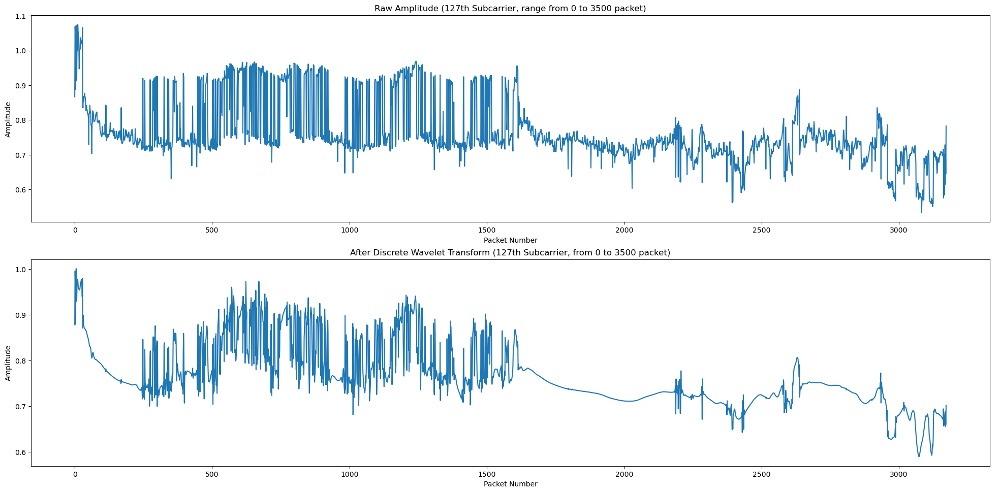

In [19]:
fig = plt.figure(figsize = (20, 10))
ax = fig.add_subplot(111)

no_denoise = amplitude
dwt_filter = dwt_all(no_denoise)

ax3 = fig.add_subplot(211)
plt.plot((no_denoise)[:, 120])
ax3.set_title("Raw Amplitude (127th Subcarrier, range from 0 to 3500 packet)")

ax4 = fig.add_subplot(212)
plt.plot(dwt_filter[:, 120])
ax4.set_title("After Discrete Wavelet Transform (127th Subcarrier, from 0 to 3500 packet)")

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)

ax3.set_ylabel('Amplitude')
ax4.set_ylabel('Amplitude')
ax3.set_xlabel('Packet Number')
ax4.set_xlabel('Packet Number')

fig.tight_layout(pad=0.7)
plt.show()

## Hampel & DWT Output Visualization

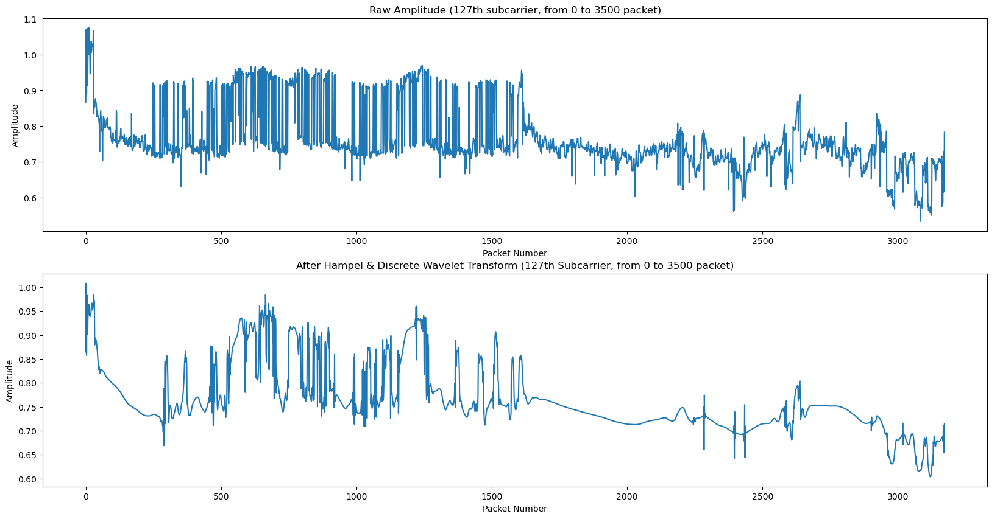

In [20]:
fig = plt.figure(figsize = (20,10))
ax = fig.add_subplot(111)

no_filter = amplitude
with_filter = filter(no_filter)

ax3 = fig.add_subplot(211)
plt.plot((no_filter)[:, 120])
ax3.set_title("Raw Amplitude (127th subcarrier, from 0 to 3500 packet)")

ax4 = fig.add_subplot(212)
plt.plot((with_filter)[:, 120])
ax4.set_title("After Hampel & Discrete Wavelet Transform (127th Subcarrier, from 0 to 3500 packet)")

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)

ax3.set_ylabel('Amplitude')
ax4.set_ylabel('Amplitude')
ax3.set_xlabel('Packet Number')
ax4.set_xlabel('Packet Number')

plt.show()

## Hampel vs DWT Comparison

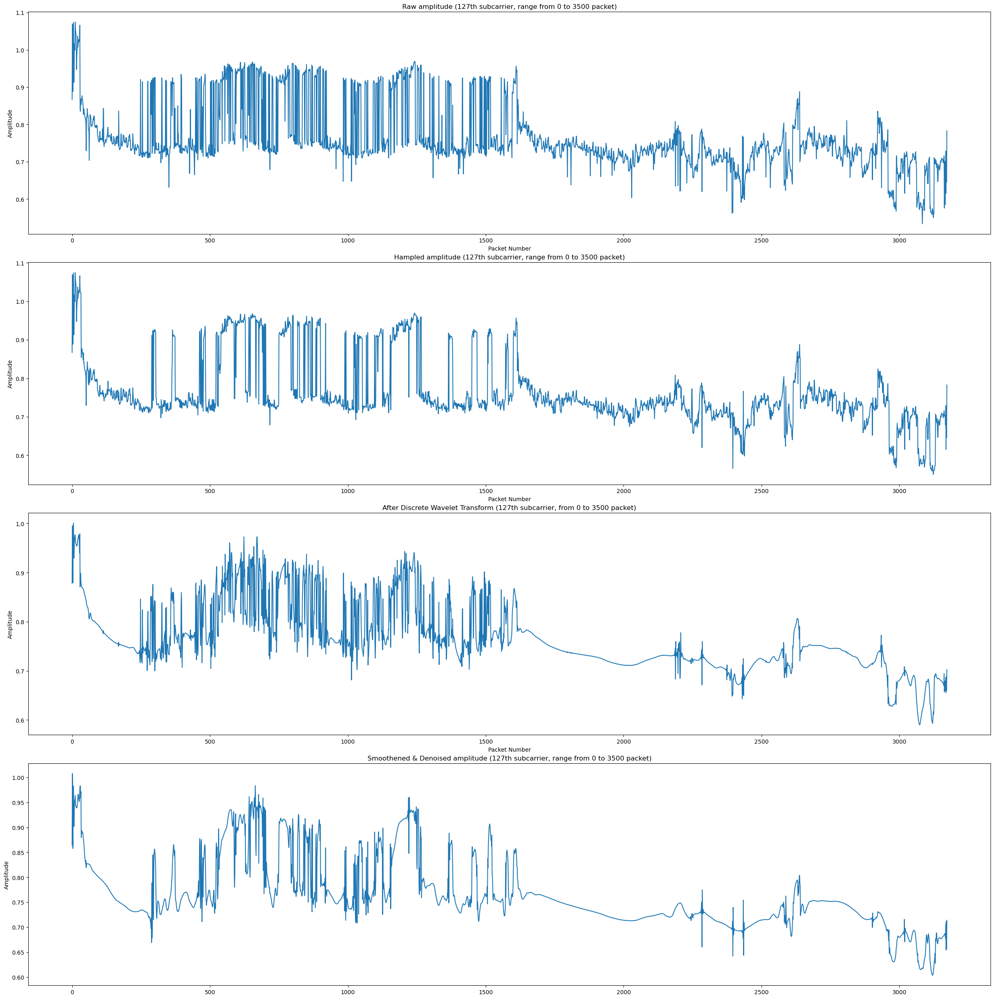

In [21]:
fig = plt.figure(figsize = (25, 25))
ax = fig.add_subplot(111)

no_hampel = amplitude
with_hampel, outliers = hampel_all(no_hampel)

no_denoise = with_hampel
with_denoise = dwt_all(no_denoise)

ax1 = fig.add_subplot(411)
plt.plot((no_hampel)[:, 120])
ax1.set_title("Raw amplitude (127th subcarrier, range from 0 to 3500 packet)")

ax2 = fig.add_subplot(412)
plt.plot(with_hampel[:, 120])
ax2.set_title("Hampled amplitude (127th subcarrier, range from 0 to 3500 packet)")

ax3 = fig.add_subplot(413)
plt.plot(dwt_filter[:, 120])
ax3.set_title("After Discrete Wavelet Transform (127th subcarrier, from 0 to 3500 packet)")

ax4 = fig.add_subplot(414)
plt.plot((with_denoise)[:, 120])
ax4.set_title("Smoothened & Denoised amplitude (127th subcarrier, range from 0 to 3500 packet)")

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)

ax1.set_ylabel('Amplitude')
ax2.set_ylabel('Amplitude')
ax3.set_ylabel('Amplitude')
ax4.set_ylabel('Amplitude')
ax1.set_xlabel('Packet Number')
ax2.set_xlabel('Packet Number')
ax3.set_xlabel('Packet Number')

fig.tight_layout(pad=0.5)
plt.show()

## Smoothen All Subcarrier (Hampel)

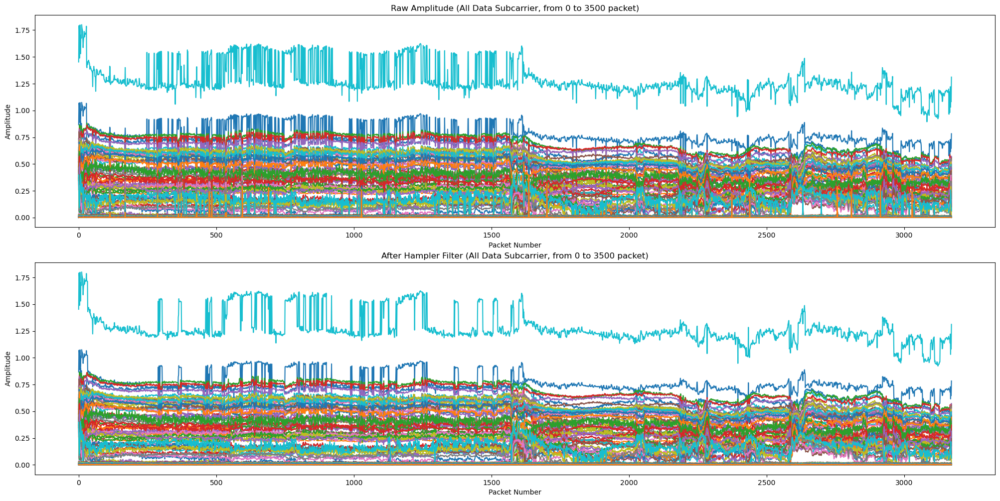

In [22]:
fig = plt.figure(figsize = (20, 10))

no_hampel = amplitude
with_hampel, outliers = hampel_all(no_hampel)

ax3 = fig.add_subplot(211)
plt.plot((no_hampel)[:, :])
ax3.set_title("Raw Amplitude (All Data Subcarrier, from 0 to 3500 packet)")

ax4 = fig.add_subplot(212)
plt.plot(with_hampel[:, :])
ax4.set_title("After Hampler Filter (All Data Subcarrier, from 0 to 3500 packet)")

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)

ax3.set_ylabel('Amplitude')
ax4.set_ylabel('Amplitude')
ax3.set_xlabel('Packet Number')
ax4.set_xlabel('Packet Number')

fig.tight_layout(pad=0.5)
plt.show()

## Denoise All Subcarrier (DWT)

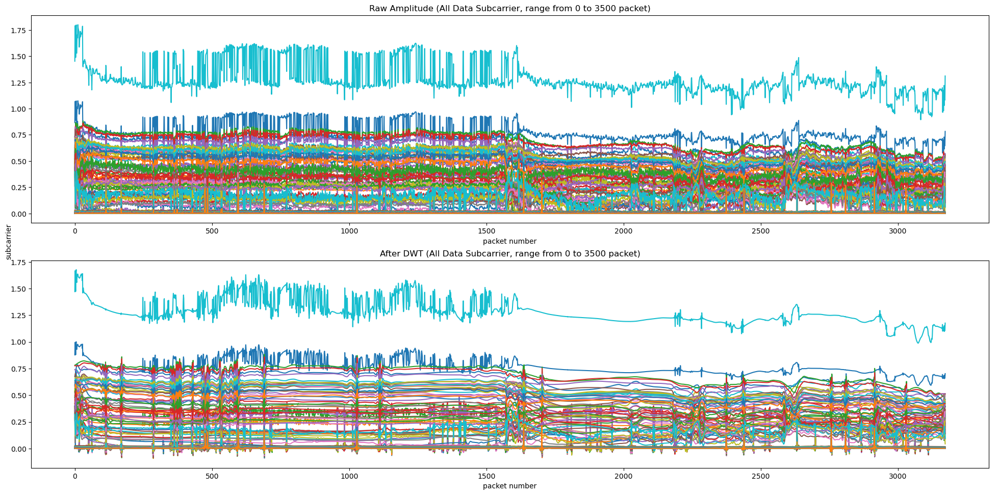

In [23]:
fig = plt.figure(figsize = (20, 10))
ax = fig.add_subplot(111)

no_denoise = amplitude
dwt_filter = dwt_all(no_denoise)

ax3 = fig.add_subplot(211)
plt.plot((no_denoise)[:, :])
ax3.set_title("Raw Amplitude (All Data Subcarrier, range from 0 to 3500 packet)")

ax4 = fig.add_subplot(212)
plt.plot(dwt_filter[:, :])
ax4.set_title("After DWT (All Data Subcarrier, range from 0 to 3500 packet)")

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)

ax.set_ylabel('subcarrier')
ax3.set_xlabel('packet number')
ax4.set_xlabel('packet number')

fig.tight_layout(pad=0.7)
plt.show()

## Hampel & DWT All Subcarrier

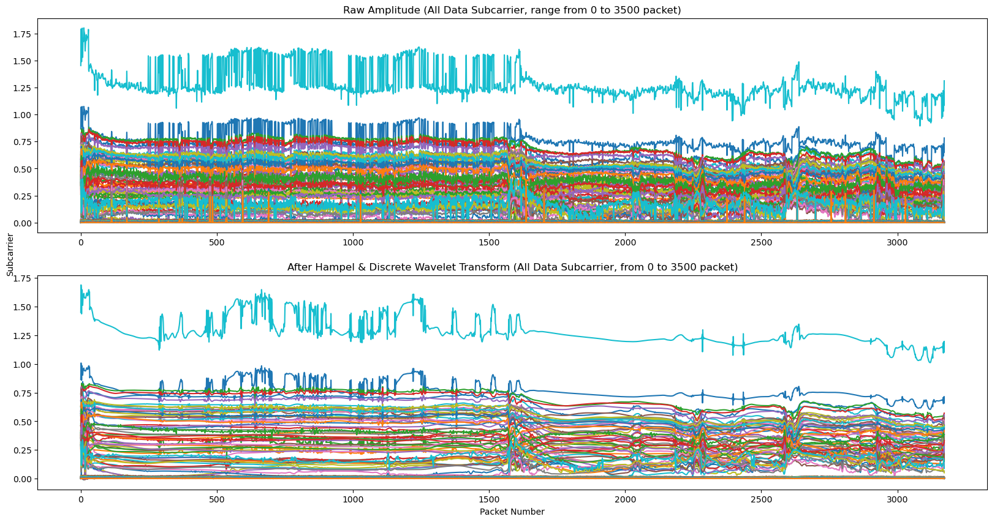

In [24]:
fig = plt.figure(figsize = (20,10))
ax = fig.add_subplot(111)

no_filter = amplitude
with_filter = filter(no_filter)

ax3 = fig.add_subplot(211)
plt.plot((no_filter)[:, :])
ax3.set_title("Raw Amplitude (All Data Subcarrier, range from 0 to 3500 packet)")

ax4 = fig.add_subplot(212)
plt.plot((with_filter)[:, :])
ax4.set_title("After Hampel & Discrete Wavelet Transform (All Data Subcarrier, from 0 to 3500 packet)")

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)

ax.set_ylabel('Subcarrier')
ax.set_xlabel('Packet Number')

plt.show()

## Raw Vs Hampel Vs DWT Vs Filtered All Subcarrier

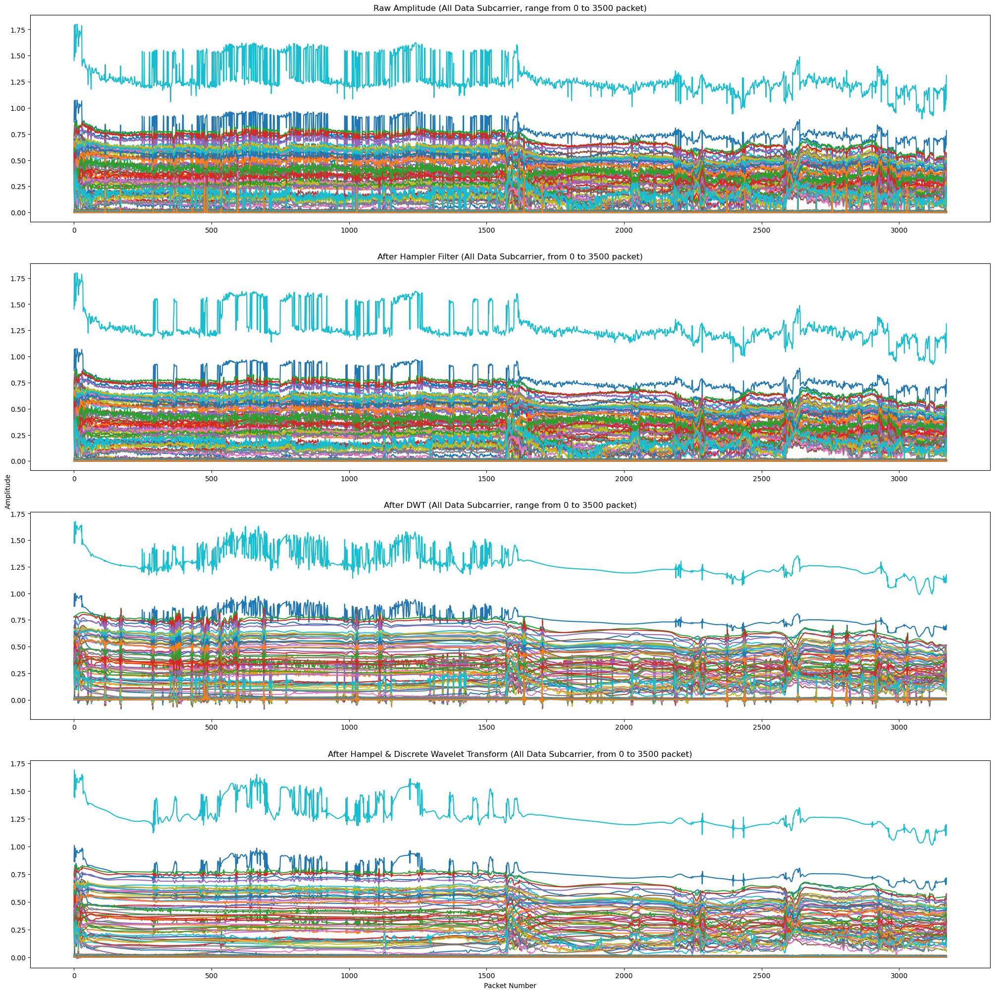

In [25]:
fig = plt.figure(figsize = (25,25))
ax = fig.add_subplot(111)

no_filter = amplitude
with_hampel, outliers = hampel_all(no_filter)
dwt_filter = dwt_all(no_filter)
with_filter = filter(no_filter)

ax1 = fig.add_subplot(411)
plt.plot((no_filter)[:, :])
ax1.set_title("Raw Amplitude (All Data Subcarrier, range from 0 to 3500 packet)")

ax2 = fig.add_subplot(412)
plt.plot(with_hampel[:, :])
ax2.set_title("After Hampler Filter (All Data Subcarrier, from 0 to 3500 packet)")

ax3 = fig.add_subplot(413)
plt.plot(dwt_filter[:, :])
ax3.set_title("After DWT (All Data Subcarrier, range from 0 to 3500 packet)")

ax4 = fig.add_subplot(414)
plt.plot((with_filter)[:, :])
ax4.set_title("After Hampel & Discrete Wavelet Transform (All Data Subcarrier, from 0 to 3500 packet)")

ax.spines['top'].set_color('none')
ax.spines['bottom'].set_color('none')
ax.spines['left'].set_color('none')
ax.spines['right'].set_color('none')
ax.tick_params(labelcolor='w', top=False, bottom=False, left=False, right=False)

ax.set_ylabel('Amplitude')
ax.set_xlabel('Packet Number')

plt.show()